# Solute in LJ Bath — 2D Boltzmann Generator (Equivariant)

A **2D Lennard-Jones system** with a single labeled solute (particle 0) and 36 identical
solvent particles.

| Property | Value |
|----------|-------|
| Particles | 37 (1 solute + 36 solvent) |
| Flow dimension | 72 (36 solvent × 2D; solute fixed at origin) |
| Energy | Repulsive LJ + soft square walls |
| Scientific observable | Solute–solvent g(r) |
| BG architecture | Equivariant Neural Spline Flow (sort-by-distance, no Hungarian needed) |


In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import itertools
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm.auto import tqdm


# Shared 2-D BG infrastructure
sys.path.insert(0, os.path.abspath('../../boltzmann_generators/Library'))
# Local potential
sys.path.insert(0, os.path.abspath('../Library'))

from potentials import SoluteSimulation2D
from sampling   import MetropolisSampler
from training   import BoltzmannGenerator
import visual as vs
from IPython.display import HTML


## 1. System Definition

**`SoluteSimulation2D`**: all-LJ pairwise repulsion + soft harmonic square walls.
No bond potential, no centering restraint.

$$U = \sum_{i<j} \varepsilon \left(\frac{\sigma^2}{r_{ij}^2}\right)^6 + k_{\rm box}\sum_i \sum_{\alpha\in\{x,y\}} \max(|r_{i\alpha}| - L,\,0)^2$$


In [2]:
N_PARTICLES = 37    # 1 solute + 36 solvent
DIM         = 2
L_BOX       = 5.0   # soft wall at ±5 nm

CENTER_SOLUTE = True   # harmonic centering on solute; set False for unconstrained
K_CENTER      = 20.0   # spring constant (same as dimer_k_xy in DimerSimulation)

solute_sys = SoluteSimulation2D(
    n_particles=N_PARTICLES, l_box=L_BOX,
    center_solute=CENTER_SOLUTE, k_center=K_CENTER,
)

print(f'N particles  : {N_PARTICLES}  (1 solute + {N_PARTICLES-1} solvent)')
print(f'Dimension    : {N_PARTICLES * DIM}  ({N_PARTICLES} x {DIM})')
print(f'Box          : [{-L_BOX}, {L_BOX}]^2  (area = {(2*L_BOX)**2:.1f} nm^2)')
print(f'LJ sigma     : {solute_sys.sigma} nm')
print(f'Center solute: {CENTER_SOLUTE}  (k={K_CENTER})')


N particles  : 37  (1 solute + 36 solvent)
Dimension    : 74  (37 x 2)
Box          : [-5.0, 5.0]^2  (area = 100.0 nm^2)
LJ sigma     : 1.1 nm
Center solute: True  (k=20.0)


## 2. Initial Configuration

Place N particles on a 2-D grid.  The grid point closest to the origin becomes
particle 0 (solute); the rest are solvent.


Initial energy: 7.7


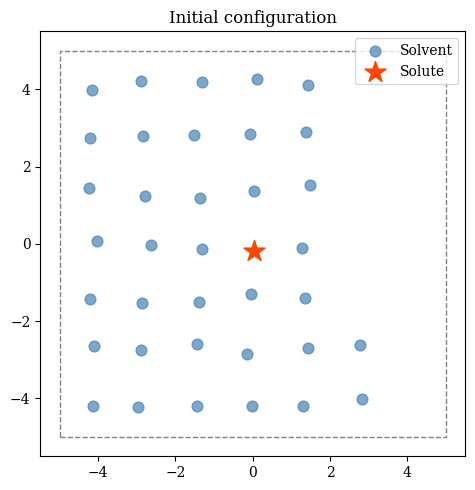

In [3]:
def build_solute_coords(N=37, l_box=3.0, noise=0.1, seed=42):
    np.random.seed(seed)
    d = (2 * l_box) / N**0.5
    n_side = int(np.ceil(np.sqrt(N)))
    pos = np.linspace(-l_box + 0.5*d, l_box - 0.5*d, n_side)
    coords = np.array(list(itertools.product(pos, repeat=2))[:N], dtype=np.float32)
    if noise:
        coords += (noise * np.random.randn(*coords.shape)).astype(np.float32)
    # Move grid point nearest origin to index 0 (solute)
    nearest = np.argmin(np.linalg.norm(coords, axis=1))
    coords[[0, nearest]] = coords[[nearest, 0]]
    return coords

coords0 = build_solute_coords(N_PARTICLES, L_BOX)
print(f'Initial energy: {solute_sys.get_energy(coords0):.1f}')

fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(coords0[1:, 0], coords0[1:, 1], s=60, c='steelblue', alpha=0.7, label='Solvent')
ax.scatter(coords0[0, 0], coords0[0, 1], s=250, c='orangered', marker='*', zorder=5, label='Solute')
ax.add_patch(plt.Rectangle((-L_BOX, -L_BOX), 2*L_BOX, 2*L_BOX, fill=False, ec='gray', ls='--'))
ax.set_xlim(-L_BOX-0.5, L_BOX+0.5); ax.set_ylim(-L_BOX-0.5, L_BOX+0.5)
ax.set_aspect('equal'); ax.legend(); ax.set_title('Initial configuration')
plt.tight_layout(); plt.show()


## 3. Monte Carlo Equilibration


In [4]:
sigma_mc = 0.1
temp_mc  = 1.0

sim_eq = MetropolisSampler(solute_sys, temp=temp_mc, sigma=sigma_mc, stride=10)
sim_eq.run(coords0.copy(), nsteps=100_000)
coords_eq = sim_eq.xtraj[-1]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(sim_eq.etraj)
axes[0].set_xlabel('Saved step'); axes[0].set_ylabel('Energy')
axes[0].set_title('Equilibration energy trajectory')

axes[1].scatter(coords_eq[1:, 0], coords_eq[1:, 1], s=40, c='steelblue', alpha=0.6, label='Solvent')
axes[1].scatter(coords_eq[0, 0], coords_eq[0, 1], s=200, c='orangered', marker='*', zorder=5, label='Solute')
axes[1].add_patch(plt.Rectangle((-L_BOX, -L_BOX), 2*L_BOX, 2*L_BOX, fill=False, ec='gray', ls='--'))
axes[1].set_aspect('equal'); axes[1].legend(); axes[1].set_title('After equilibration')
plt.tight_layout(); plt.show()


  0%|          | 0/100000 [00:00<?, ?it/s]

KeyboardInterrupt: 

## 4. Production MC Sampling

Run a long production trajectory and cache to disk.


In [5]:
os.makedirs('MC_data', exist_ok=True)
data_path = f'MC_data/Solute2D_prod_L5_center.npz'

if os.path.isfile(data_path):
    print(f'Loading MC data from {data_path}')
    d = np.load(data_path)
    xtraj = d['xtraj']   # (n_saved, N, 2)
    etraj = d['etraj']
else:
    print('Running production MC...')
    sim_prod = MetropolisSampler(solute_sys, temp=temp_mc, sigma=sigma_mc, stride=100)
    sim_prod.run(coords_eq.copy(), nsteps=5_000_000)
    xtraj = sim_prod.xtraj
    etraj = sim_prod.etraj
    np.savez(data_path, xtraj=xtraj, etraj=etraj)
    print(f'Saved {len(xtraj)} frames to {data_path}')

print(f'Frames : {len(xtraj)}')
print(f'Energy : mean={etraj.mean():.1f},  std={etraj.std():.1f}')


Loading MC data from MC_data/Solute2D_prod_L5_center.npz
Frames : 5001
Energy : mean=9.3,  std=2.9


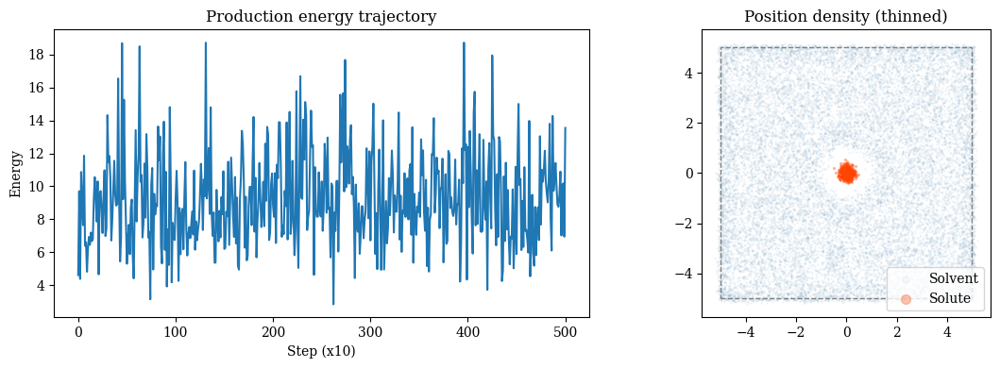

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(etraj[::10])
axes[0].set_xlabel('Step (x10)'); axes[0].set_ylabel('Energy')
axes[0].set_title('Production energy trajectory')

# Scatter of all solute positions
axes[1].scatter(xtraj[::10, 1:, 0].ravel(), xtraj[::10, 1:, 1].ravel(),
                s=1, c='steelblue', alpha=0.05, label='Solvent')
axes[1].scatter(xtraj[::10, 0, 0], xtraj[::10, 0, 1],
                s=2, c='orangered', alpha=0.3, label='Solute')
axes[1].add_patch(plt.Rectangle((-L_BOX, -L_BOX), 2*L_BOX, 2*L_BOX, fill=False, ec='gray', ls='--'))
axes[1].set_aspect('equal'); axes[1].legend(markerscale=5)
axes[1].set_title('Position density (thinned)')
plt.tight_layout(); plt.show()


## 5. Radial Distribution Function — MC Reference

The **solute–solvent g(r)** measures the probability of finding a solvent particle
at distance r from the solute, relative to an ideal gas at the same density.
Expected: first peak at r ≈ σ = 1.1 nm (LJ excluded volume).


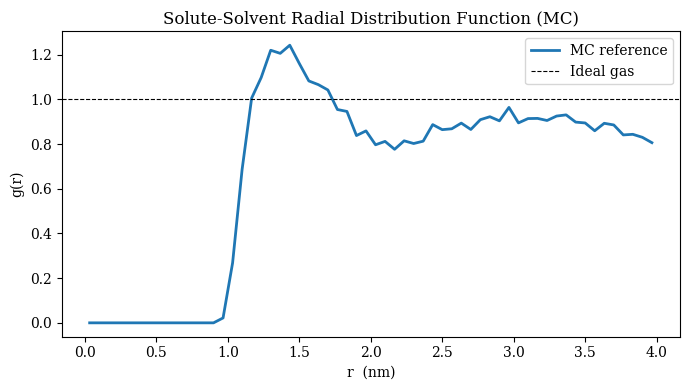

First peak: r = 1.43 nm  (LJ sigma = 1.1 nm)


In [7]:
def compute_gr_solute(traj, N, l_box, n_bins=60, r_max=4.0):
    """
    Solute-solvent g(r).  traj: (n_frames, N, 2).
    """
    r_edges   = np.linspace(0, r_max, n_bins + 1)
    r_centers = 0.5 * (r_edges[:-1] + r_edges[1:])
    dr        = r_centers[1] - r_centers[0]
    counts    = np.zeros(n_bins)
    for frame in traj:
        dists = np.linalg.norm(frame[1:] - frame[0], axis=1)
        hist, _ = np.histogram(dists, bins=r_edges)
        counts += hist
    rho  = (N - 1) / (2 * l_box)**2   # number density of solvent
    norm = len(traj) * rho * 2 * np.pi * r_centers * dr
    return r_centers, counts / norm

r_mc, gr_mc = compute_gr_solute(xtraj, N_PARTICLES, L_BOX)

fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(r_mc, gr_mc, lw=2, label='MC reference')
ax.axhline(1.0, color='k', ls='--', lw=0.8, label='Ideal gas')
ax.set_xlabel('r  (nm)'); ax.set_ylabel('g(r)')
ax.set_title('Solute-Solvent Radial Distribution Function (MC)')
ax.legend(); plt.tight_layout(); plt.show()
print(f'First peak: r = {r_mc[gr_mc.argmax()]:.2f} nm  (LJ sigma = {solute_sys.sigma} nm)')


## 6. Data Preprocessing — No Reordering Needed

With `equivariant=True`, the flow internally sorts solvent particles by distance from
the solute before every forward/inverse pass.  Any permutation of the input labels
maps to the same canonical ordering, so the loss is identical for all relabellings.

**No Hungarian algorithm required.** Just strip particle 0 (solute) and flatten.


In [8]:
# Strip solute (particle 0) — no reordering of solvents needed.
x_solvent = xtraj[:, 1:, :].reshape(len(xtraj), (N_PARTICLES - 1) * DIM).astype('float32')
print(f'Training data shape: {x_solvent.shape}')   # (n_frames, 72)


Training data shape: (5001, 72)


## 7. Boltzmann Generator — Equivariant Neural Spline Flow

Rational-quadratic spline coupling flow from `generator.py`.

- **Solvent-only**: models 36 solvents (72-dim); solute fixed at origin.
- **Equivariant**: internally sorts particles by distance from solute → no Hungarian.
- **Prior**: isotropic Gaussian N(0, I₇₂).
- **Coupling**: 8 blocks × 2 layers (16 total); even = near-shell, odd = far-shell.

**Stage 1**: ML training — learns the data distribution.
**Stage 2**: KL fine-tune with overlap penalty — improves low-energy coverage.


In [19]:
# model_equi = build_perm_equivariant_flow(
#     system=solute_sys,
#     n_particles=36,
#     n_layers=6,
#     hidden=64,
# )

from generator import build_equivariant_boltzmann_generator

model_equi = build_equivariant_boltzmann_generator(
    system=solute_sys,
    n_particles=36,
    n_layers=8,
    num_bins=8,
    hidden=128,
    tail_bound=5.0,
)

# model_equi = build_invariant_pairwise_flow(solute_sys, n_particles=36, n_blocks=8, hidden=128)

In [28]:
# Original (unchanged)
# model_equi = build_equivariant_boltzmann_generator(solute_sys, n_layers=8)

# Alternating radial+angular
model_equi = build_equivariant_boltzmann_generator(solute_sys, n_layers=8, layer_type='alternating')


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from generator_equi import build_spherical_equivariant_flow

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_equi = build_spherical_equivariant_flow(
    system=solute_sys,
    n_particles=36,
    n_blocks=8,
    num_bins=8,
    hidden=128,
    tail_bound=5.0,
    max_angle=0.5,
).to(device)

In [27]:
train_data = torch.tensor(
    x_solvent,
    device=device,
    dtype=torch.float32,
)

def sample_training_batch(batch_size):
    idx = torch.randint(
        low=0,
        high=train_data.shape[0],
        size=(batch_size,),
        device=device,
    )
    return train_data[idx]

In [28]:
n_ml_steps = 5000
batch_size = 128
lr = 1e-4

optimizer = torch.optim.Adam(model_equi.parameters(), lr=lr, weight_decay=1e-6)

ml_loss_history = []

for step in range(n_ml_steps):
    model_equi.train()
    optimizer.zero_grad()

    batch_x = sample_training_batch(batch_size).to(device).float()
    # batch_x shape: (B, 72), solvent only

    loss = model_equi.loss_ML(batch_x)

    loss.backward()
    torch.nn.utils.clip_grad_norm_(model_equi.parameters(), max_norm=10.0)
    optimizer.step()

    ml_loss_history.append(loss.item())

    if step % 100 == 0:
        print(f"ML step {step:6d} | loss {loss.item():.6f}")

ML step      0 | loss 396.015625
ML step    100 | loss 178.733231
ML step    200 | loss 177.126953
ML step    300 | loss 176.772079


KeyboardInterrupt: 

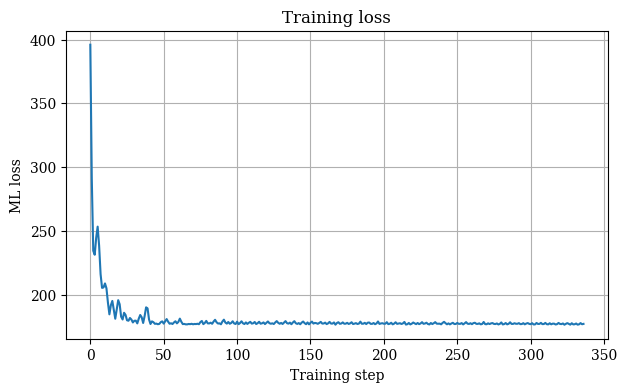

In [35]:
plt.figure(figsize=(7, 4))
plt.plot(ml_loss_history)
plt.xlabel("Training step")
plt.ylabel("ML loss")
plt.title("Training loss")
plt.grid(True)
plt.show()

In [30]:
model_equi.eval()

n_gen = 5000

with torch.no_grad():
    z = model_equi.prior.sample(
        n_gen,
        device=device,
        dtype=torch.float32,
    )
    x_solvent_gen, logdet_gen = model_equi.generator(z)

x_solvent_gen_cpu = x_solvent_gen.detach().cpu()

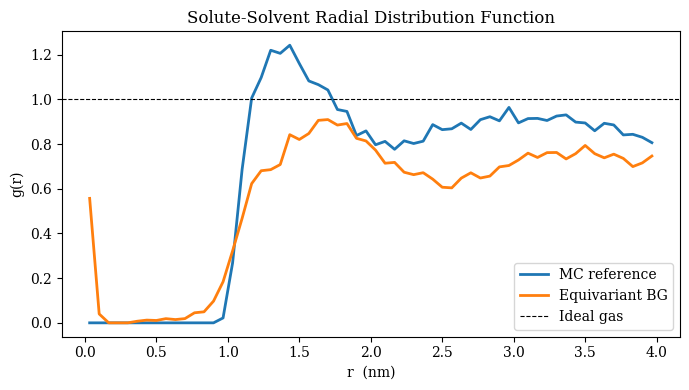

MC first peak: r = 1.43 nm
BG first peak: r = 1.70 nm
LJ sigma = 1.1 nm


In [31]:
x_bg_3d = torch.cat(
    [
        torch.zeros(n_gen, 1, 2),
        x_solvent_gen_cpu.view(n_gen, 36, 2),
    ],
    dim=1,
).numpy()

r_mc, gr_mc = compute_gr_solute(xtraj, N_PARTICLES, L_BOX)
r_bg, gr_bg = compute_gr_solute(x_bg_3d, N_PARTICLES, L_BOX)

fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(r_mc, gr_mc, lw=2, label="MC reference")
ax.plot(r_bg, gr_bg, lw=2, label="Equivariant BG")
ax.axhline(1.0, color="k", ls="--", lw=0.8, label="Ideal gas")

ax.set_xlabel("r  (nm)")
ax.set_ylabel("g(r)")
ax.set_title("Solute-Solvent Radial Distribution Function")
ax.legend()
plt.tight_layout()
plt.show()

print(f"MC first peak: r = {r_mc[gr_mc.argmax()]:.2f} nm")
print(f"BG first peak: r = {r_bg[gr_bg.argmax()]:.2f} nm")
print(f"LJ sigma = {solute_sys.sigma} nm")

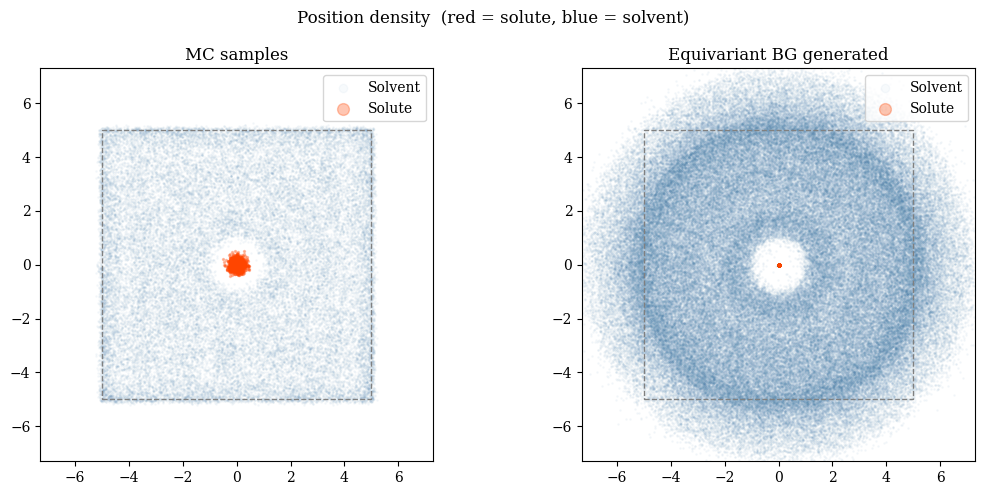

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
datasets = [
    (xtraj[::5], "MC samples"),
    (x_bg_3d, "Equivariant BG generated"),
]

for ax, (traj, title) in zip(axes, datasets):
    ax.scatter(
        traj[:, 1:, 0].ravel(),
        traj[:, 1:, 1].ravel(),
        s=1,
        c="steelblue",
        alpha=0.04,
        label="Solvent",
    )

    ax.scatter(
        traj[:, 0, 0],
        traj[:, 0, 1],
        s=2,
        c="orangered",
        alpha=0.3,
        label="Solute",
    )

    ax.add_patch(
        plt.Rectangle(
            (-L_BOX, -L_BOX),
            2 * L_BOX,
            2 * L_BOX,
            fill=False,
            ec="gray",
            ls="--",
        )
    )

    ax.set_xlim(-L_BOX - 2.3, L_BOX + 2.3)
    ax.set_ylim(-L_BOX - 2.3, L_BOX + 2.3)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.legend(markerscale=6, loc="upper right")

plt.suptitle("Position density  (red = solute, blue = solvent)")
plt.tight_layout()
plt.show()

In [ ]:
alpha = 0.8
beta = 0.2

n_mix_steps = 10000
batch_size = 128

optimizer = torch.optim.Adam(model_equi.parameters(), lr=5e-5, weight_decay=1e-6)

mix_loss_history = []

for step in range(n_mix_steps):
    model_equi.train()
    optimizer.zero_grad()

    batch_x = sample_training_batch(batch_size).to(device).float()

    batch_z = model_equi.prior.sample(
        batch_size,
        device=device,
        dtype=torch.float32,
    )

    loss_ml = model_equi.loss_ML(batch_x)
    loss_kl = model_equi.loss_KL(batch_z)

    loss = alpha * loss_ml + beta * loss_kl

    loss.backward()
    torch.nn.utils.clip_grad_norm_(model_equi.parameters(), max_norm=10.0)
    optimizer.step()

    mix_loss_history.append([
        loss.item(),
        loss_ml.item(),
        loss_kl.item(),
    ])

    if step % 100 == 0:
        print(
            f"Mix step {step:6d} | "
            f"loss {loss.item():.6f} | "
            f"ML {loss_ml.item():.6f} | "
            f"KL {loss_kl.item():.6f}"
        )

In [ ]:
n_kl_steps = 10000
lr = 5e-5

optimizer = torch.optim.Adam(model_equi.parameters(), lr=lr, weight_decay=1e-6)

kl_loss_history = []

for step in range(n_kl_steps):
    model_equi.train()
    optimizer.zero_grad()

    batch_z = model_equi.prior.sample(
        batch_size,
        device=device,
        dtype=torch.float32,
    )

    loss = model_equi.loss_KL(batch_z)

    loss.backward()
    torch.nn.utils.clip_grad_norm_(model_equi.parameters(), max_norm=10.0)
    optimizer.step()

    kl_loss_history.append(loss.item())

    if step % 100 == 0:
        print(f"KL step {step:6d} | loss {loss.item():.6f}")

step      0 | loss 10062.213867
step    100 | loss 9721.660156
step    200 | loss 9720.026367
step    300 | loss 9720.473633
step    400 | loss 9719.488281


KeyboardInterrupt: 

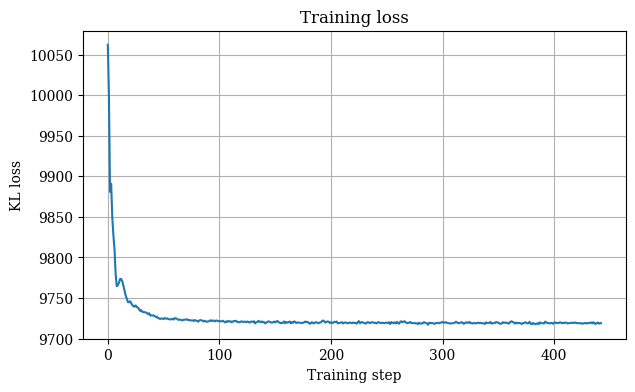

In [16]:
plt.figure(figsize=(7, 4))
plt.plot(loss_history)
plt.xlabel("Training step")
plt.ylabel("KL loss")
plt.title("Training loss")
plt.grid(True)
plt.show()

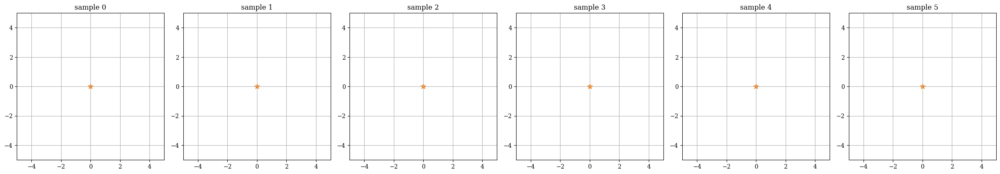

In [21]:
def plot_generated_samples(x_gen, n_particles=36, n_show=6, box_lim=5.0):
    """
    x_gen: (B, N*2), solvent-only generated samples.
    Solute is plotted at origin.
    """
    x_np = x_gen.detach().cpu().numpy()
    n_show = min(n_show, x_np.shape[0])

    fig, axes = plt.subplots(1, n_show, figsize=(4 * n_show, 4))

    if n_show == 1:
        axes = [axes]

    for k in range(n_show):
        coords = x_np[k].reshape(n_particles, 2)

        ax = axes[k]
        ax.scatter(coords[:, 0], coords[:, 1], s=25, label="solvent")
        ax.scatter([0.0], [0.0], s=80, marker="*", label="solute")

        ax.set_aspect("equal")
        ax.set_xlim(-box_lim, box_lim)
        ax.set_ylim(-box_lim, box_lim)
        ax.set_title(f"sample {k}")
        ax.grid(True)

    plt.tight_layout()
    plt.show()


plot_generated_samples(
    x_many,
    n_particles=36,
    n_show=6,
    box_lim=5.0,
)
plt.show()

In [23]:
with torch.no_grad():
    z = model_equi.prior.sample(
        1000,
        device=device,
        dtype=torch.float32,
    )
    x_many, _ = model_equi.generator(z)


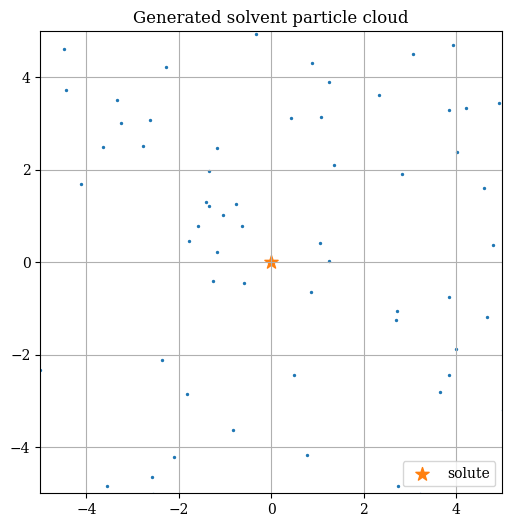

In [24]:

coords = x_many.detach().cpu().numpy().reshape(-1, 2)

plt.figure(figsize=(6, 6))
plt.scatter(coords[:, 0], coords[:, 1], s=2, alpha=1.0)
plt.scatter([0], [0], s=100, marker="*", label="solute")
plt.gca().set_aspect("equal")
plt.xlim(-5, 5)
plt.ylim(-5, 5)
plt.title("Generated solvent particle cloud")
plt.grid(True)
plt.legend()
plt.show()

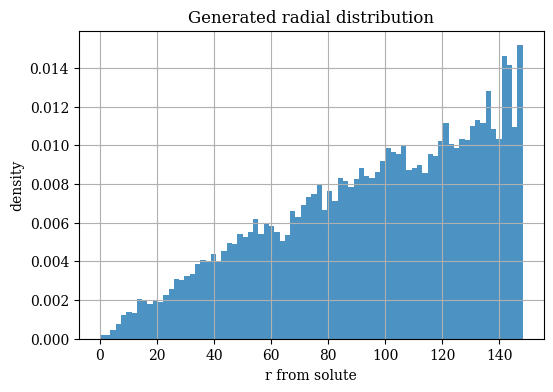

In [25]:

r = np.linalg.norm(coords, axis=-1).reshape(-1)

plt.figure(figsize=(6, 4))
plt.hist(r, bins=80, density=True, alpha=0.8)
plt.xlabel("r from solute")
plt.ylabel("density")
plt.title("Generated radial distribution")
plt.grid(True)
plt.show()

In [14]:
x_test = torch.as_tensor(x_solvent[:8], dtype=torch.float32)
z, ld = model_equi.inverse_generator(x_test)
x_rec, ld_inv = model_equi.generator(z)

print((x_test - x_rec).abs().max().item())
print((ld + ld_inv).abs().max().item())

1.6450881958007812e-05
6.866455078125e-05


In [30]:
VERSION = 'v1'

if CENTER_SOLUTE:
    FOLDER = 'Center/'
    VERSION += '_center'

FOLDER += 'Equivariant_Spline'


os.makedirs(f'Trained_models/Solute/{FOLDER}', exist_ok=True)

# Stage 1 — ML training
BG_equi = BoltzmannGenerator({
    'n_blocks'   : 8,
    'dimension'  : (N_PARTICLES - 1) * DIM,    # 72
    'reshape'    : (N_PARTICLES - 1, DIM),      # (36, 2)
    'n_nodes'    : 128,
    'n_layers'   : 3,
    'n_epochs'   : 50,
    'batch_size' : 512,
    'LR'         : 1e-5,
    'patience'   : 50,
    'min_delta'  : 1e-4,
    'w_overlap'  : 10.0,
})

model_path_ML = f'Trained_models/Solute/{FOLDER}/model_ML_{VERSION}.pt'


if os.path.isfile(model_path_ML):
    print(f'Loading ML model from {model_path_ML}')
    model_equi.load_state_dict(torch.load(model_path_ML, weights_only=True))
    loss_ml = []
else:
    print('Training Stage 1: ML only...')
    BG_equi.train(model_equi, w_loss=[1.0, 0.0, 0.0], x_samples=x_solvent)
    torch.save(model_equi.state_dict(), model_path_ML)
    print(f'Saved to {model_path_ML}')
    loss_ml = BG_equi.loss_iteration

Training Stage 1: ML only...


  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

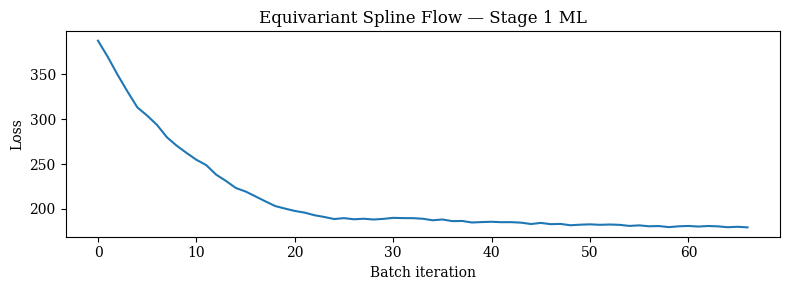

In [31]:
loss_ml = BG_equi.loss_iteration

if loss_ml:
    window   = max(1, len(loss_ml) // 200)
    smoothed = np.convolve(loss_ml, np.ones(window)/window, mode='valid')
    plt.figure(figsize=(8, 3))
    plt.plot(smoothed)
    plt.xlabel('Batch iteration'); plt.ylabel('Loss')
    plt.title('Equivariant Spline Flow — Stage 1 ML')
    plt.tight_layout(); plt.show()

In [33]:
# Stage 2 — KL fine-tune with overlap penalty
BG_equi_KL = BoltzmannGenerator({
    'n_blocks'   : 8,
    'dimension'  : (N_PARTICLES - 1) * DIM,
    'reshape'    : (N_PARTICLES - 1, DIM),
    'n_nodes'    : 256,
    'n_layers'   : 3,
    'n_epochs'   : 10,
    'batch_size' : 512,
    'LR'         : 1e-4,
    'patience'   : 30,
    'min_delta'  : 1e-4,
    # 'w_overlap'  : 20.0,   # overlap penalty weight (solvent-solvent distances)
})

model_path_KL = f'Trained_models/Solute/{FOLDER}/model_KL_{VERSION}.pt'

n_kl = 50_000
z_kl = np.random.randn(n_kl, (N_PARTICLES - 1) * DIM).astype('float32')

if os.path.isfile(model_path_KL):
    print(f'Loading KL model from {model_path_KL}')
    model_equi.load_state_dict(torch.load(model_path_KL, weights_only=True))
    loss_kl = []
else:
    print('Training Stage 2: KL fine-tune...')
    BG_equi_KL.train(model_equi, w_loss=[0.9, 0.1, 0.0],
                       x_samples=x_solvent, z_samples=z_kl)
    torch.save(model_equi.state_dict(), model_path_KL)
    print(f'Saved to {model_path_KL}')
    loss_kl = BG_equi_KL.loss_iteration



Training Stage 2: KL fine-tune...


  0%|          | 0/10 [00:00<?, ?it/s]

: 

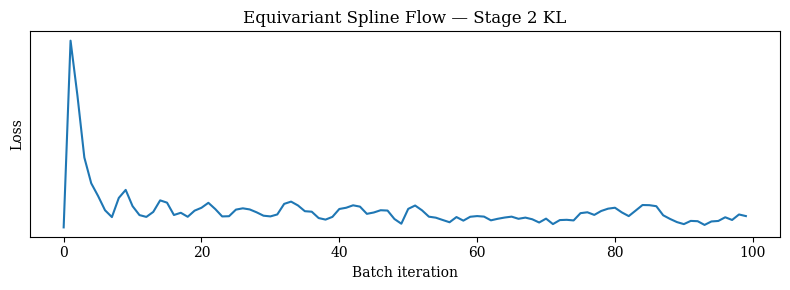

In [16]:
loss_kl = BG_equi_KL.loss_iteration
if loss_kl:
    window   = max(1, len(loss_kl) // 200)
    smoothed = np.convolve(loss_kl, np.ones(window)/window, mode='valid')
    plt.figure(figsize=(8, 3))
    plt.plot(smoothed)
    plt.xlabel('Batch iteration'); plt.ylabel('Loss')
    plt.title('Equivariant Spline Flow — Stage 2 KL')
    plt.yscale('symlog'); plt.tight_layout(); plt.show()

Training Stage 2: KL fine-tune...


  0%|          | 0/50 [00:00<?, ?it/s]

Total loss: 1101.2459716796875
Early stopping at epoch 31 (no improvement for 30 epochs)
Saved to Trained_models/Solute/spline_eq_KL_v2_spline_eq.pt


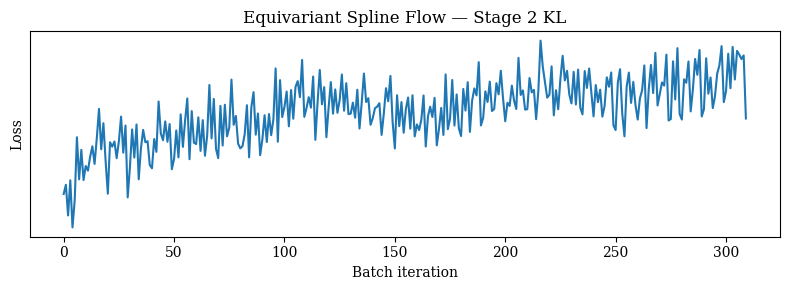

In [37]:
# Stage 2 — KL fine-tune with overlap penalty
BG_spline_KL = BoltzmannGenerator({
    'n_blocks'   : 8,
    'dimension'  : (N_PARTICLES - 1) * DIM,
    'reshape'    : (N_PARTICLES - 1, DIM),
    'n_nodes'    : 256,
    'n_layers'   : 3,
    'n_epochs'   : 50,
    'batch_size' : 512,
    'LR'         : 1e-4,
    'patience'   : 30,
    'min_delta'  : 1e-4,
    'w_overlap'  : 10.0,   # overlap penalty weight (solvent-solvent distances)
})

model_path_KL = f'Trained_models/Solute/spline_eq_KL_{VERSION}.pt'

n_kl = 50_000
z_kl = np.random.randn(n_kl, (N_PARTICLES - 1) * DIM).astype('float32')

if os.path.isfile(model_path_KL):
    print(f'Loading KL model from {model_path_KL}')
    model_spline.load_state_dict(torch.load(model_path_KL, weights_only=True))
    loss_kl = []
else:
    print('Training Stage 2: KL fine-tune...')
    BG_spline_KL.train(model_spline, w_loss=[0.9, 0.1, 0.0],
                       x_samples=x_solvent, z_samples=z_kl)
    torch.save(model_spline.state_dict(), model_path_KL)
    print(f'Saved to {model_path_KL}')
    loss_kl = BG_spline_KL.loss_iteration

if loss_kl:
    window   = max(1, len(loss_kl) // 200)
    smoothed = np.convolve(loss_kl, np.ones(window)/window, mode='valid')
    plt.figure(figsize=(8, 3))
    plt.plot(smoothed)
    plt.xlabel('Batch iteration'); plt.ylabel('Loss')
    plt.title('Equivariant Spline Flow — Stage 2 KL')
    plt.yscale('symlog'); plt.tight_layout(); plt.show()


## 8. Evaluation: g(r) Comparison

Generate samples from the trained BG and compare the solute–solvent g(r)
against the MC reference.  A well-trained BG should reproduce the first
solvation shell peak and the bulk-fluid plateau (g → 1).


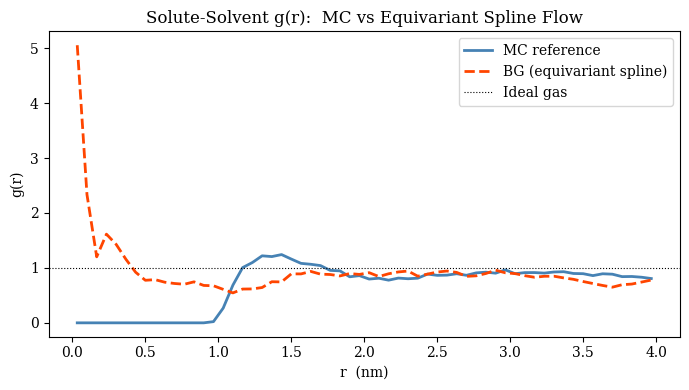

In [23]:
n_gen = 5_000

with torch.no_grad():
    z_gen = torch.randn(n_gen, (N_PARTICLES - 1) * DIM)
    x_solvent_gen, _ = model_equi.generator(z_gen)            # (n_gen, 72) solvents

    # Prepend fixed solute at (0, 0) for g(r) and scatter plots
    x_full_gen = model_equi._add_fixed_solute(x_solvent_gen)  # (n_gen, 74)

x_gen = x_full_gen.numpy().reshape(n_gen, N_PARTICLES, DIM)    # (n_gen, 37, 2)

r_bg, gr_bg = compute_gr_solute(x_gen, N_PARTICLES, L_BOX)

fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(r_mc, gr_mc, lw=2, color='steelblue', label='MC reference')
ax.plot(r_bg, gr_bg, lw=2, color='orangered', ls='--', label='BG (equivariant spline)')
ax.axhline(1.0, color='k', ls=':', lw=0.8, label='Ideal gas')
ax.set_xlabel('r  (nm)'); ax.set_ylabel('g(r)')
ax.set_title('Solute-Solvent g(r):  MC vs Equivariant Spline Flow')
ax.legend(); plt.tight_layout(); plt.show()


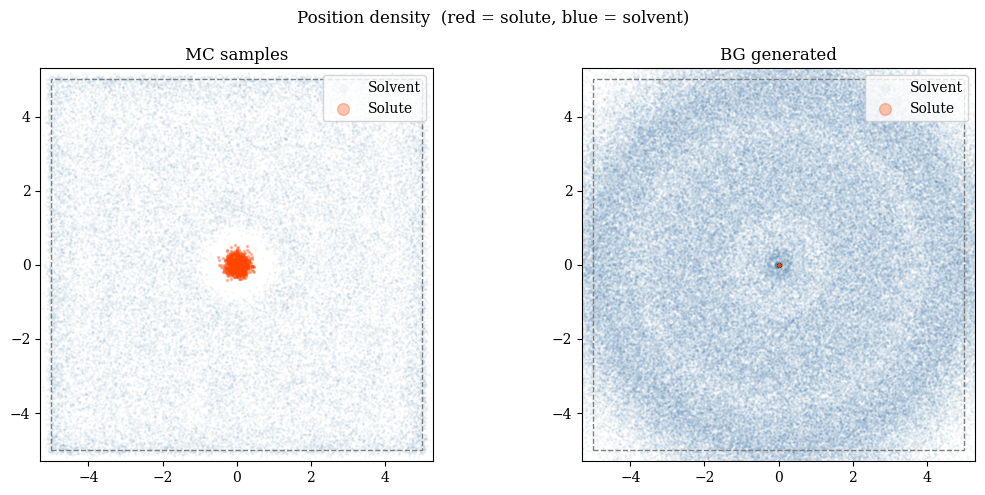

In [24]:
# Reshape BG output and add fixed solute at (0,0)
x_bg_3d = torch.cat([
    torch.zeros(n_gen, 1, 2),                # solute at origin
    x_solvent_gen.view(n_gen, 36, 2)
], dim=1).numpy()                            # (n_gen, 37, 2)

# Side-by-side snapshot density: MC vs BG
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
datasets = [(xtraj[::5], 'MC samples'), (x_bg_3d, 'BG generated')]

for ax, (traj, title) in zip(axes, datasets):
    ax.scatter(traj[:, 1:, 0].ravel(), traj[:, 1:, 1].ravel(),
               s=1, c='steelblue', alpha=0.04, label='Solvent')
    ax.scatter(traj[:, 0, 0], traj[:, 0, 1],
               s=2, c='orangered', alpha=0.3, label='Solute')
    ax.add_patch(plt.Rectangle((-L_BOX, -L_BOX), 2*L_BOX, 2*L_BOX,
                               fill=False, ec='gray', ls='--'))
    ax.set_xlim(-L_BOX-0.3, L_BOX+0.3); ax.set_ylim(-L_BOX-0.3, L_BOX+0.3)
    ax.set_aspect('equal'); ax.set_title(title)
    ax.legend(markerscale=6, loc='upper right')

plt.suptitle('Position density  (red = solute, blue = solvent)')
plt.tight_layout(); plt.show()


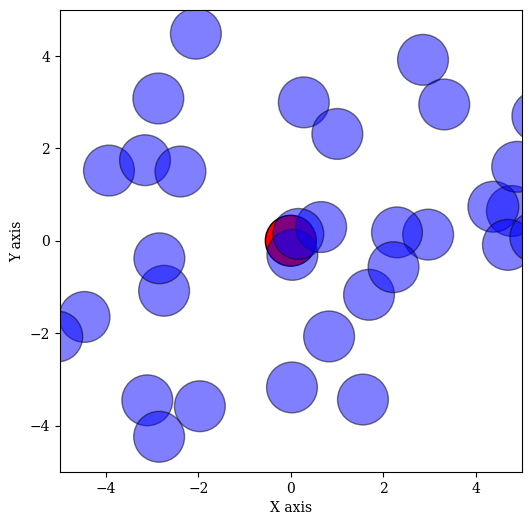

In [25]:
ani = vs.make_2D_traj_circles(x_bg_3d[0:-1:50], box = [10,10], sigma=1.1, fps=30)
HTML(ani.to_jshtml())

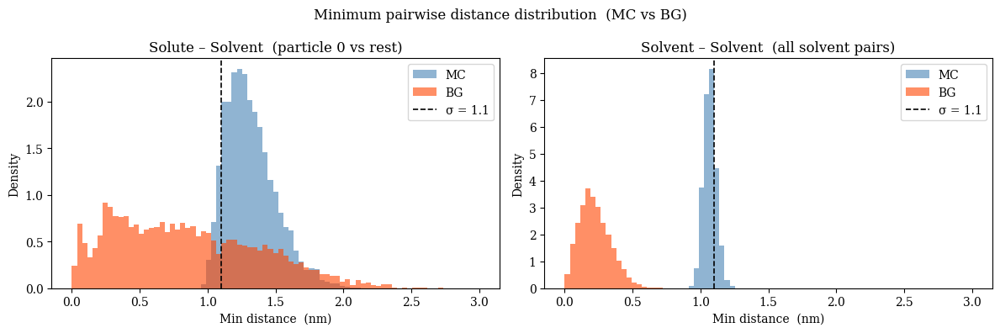

MC  — solute-solv min: 0.961   solv-solv min: 0.934
BG  — solute-solv min: 0.002   solv-solv min: 0.001


In [26]:
def min_distances(traj, n_particles):
    """
    For each frame compute:
      - min solute-solvent distance  (particle 0 vs 1..N-1)
      - min solvent-solvent distance (all pairs within 1..N-1)
    traj : (n_frames, N, 2)
    """
    d_sol_solv = np.zeros(len(traj))
    d_solv_solv = np.zeros(len(traj))
    for i, frame in enumerate(traj):
        solute  = frame[0]          # (2,)
        solvent = frame[1:]         # (N-1, 2)

        # solute-solvent
        dists_ss = np.linalg.norm(solvent - solute, axis=1)
        d_sol_solv[i] = dists_ss.min()

        # solvent-solvent: all pairwise (vectorised)
        diff = solvent[:, None, :] - solvent[None, :, :]   # (N-1, N-1, 2)
        r = np.linalg.norm(diff, axis=-1)                  # (N-1, N-1)
        np.fill_diagonal(r, np.inf)
        d_solv_solv[i] = r.min()

    return d_sol_solv, d_solv_solv


mc_ss,  mc_vv  = min_distances(xtraj,  N_PARTICLES)
bg_ss,  bg_vv  = min_distances(x_gen,  N_PARTICLES)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
bins = np.linspace(0, 3.0, 80)

for ax, (mc_d, bg_d, title) in zip(axes, [
        (mc_ss,  bg_ss,  'Solute – Solvent  (particle 0 vs rest)'),
        (mc_vv,  bg_vv,  'Solvent – Solvent  (all solvent pairs)'),
]):
    ax.hist(mc_d, bins=bins, density=True, alpha=0.6, color='steelblue', label='MC')
    ax.hist(bg_d, bins=bins, density=True, alpha=0.6, color='orangered', label='BG')
    ax.axvline(solute_sys.sigma, color='k', ls='--', lw=1.2, label=f'σ = {solute_sys.sigma}')
    ax.set_xlabel('Min distance  (nm)')
    ax.set_ylabel('Density')
    ax.set_title(title)
    ax.legend()

plt.suptitle('Minimum pairwise distance distribution  (MC vs BG)')
plt.tight_layout()
plt.show()

print(f"MC  — solute-solv min: {mc_ss.min():.3f}   solv-solv min: {mc_vv.min():.3f}")
print(f"BG  — solute-solv min: {bg_ss.min():.3f}   solv-solv min: {bg_vv.min():.3f}")

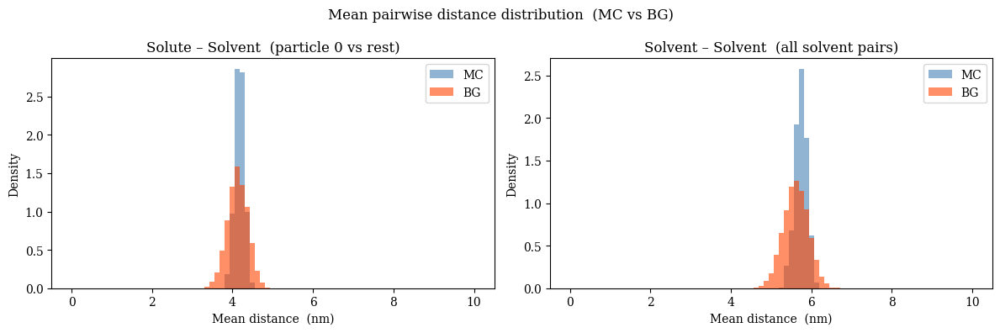

MC  — solute-solv mean: 4.174   solv-solv mean: 5.745
BG  — solute-solv mean: 4.126   solv-solv mean: 5.616


In [27]:
def mean_distances(traj, n_particles):
    """
    For each frame compute:
      - mean solute-solvent distance  (particle 0 vs 1..N-1)
      - mean solvent-solvent distance (all pairs within 1..N-1)
    traj : (n_frames, N, 2)
    """
    d_sol_solv = np.zeros(len(traj))
    d_solv_solv = np.zeros(len(traj))
    for i, frame in enumerate(traj):
        solute  = frame[0]          # (2,)
        solvent = frame[1:]         # (N-1, 2)

        # solute-solvent
        dists_ss = np.linalg.norm(solvent - solute, axis=1)
        d_sol_solv[i] = dists_ss.mean()

        # solvent-solvent: upper triangle only (no self-pairs)
        diff = solvent[:, None, :] - solvent[None, :, :]
        r = np.linalg.norm(diff, axis=-1)
        upper = r[np.triu_indices(len(solvent), k=1)]   # k=1 skips diagonal
        d_solv_solv[i] = upper.mean()

    return d_sol_solv, d_solv_solv


mc_ss,  mc_vv  = mean_distances(xtraj,  N_PARTICLES)
bg_ss,  bg_vv  = mean_distances(x_gen,  N_PARTICLES)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
bins = np.linspace(0, 10.0, 80)

for ax, (mc_d, bg_d, title) in zip(axes, [
        (mc_ss,  bg_ss,  'Solute – Solvent  (particle 0 vs rest)'),
        (mc_vv,  bg_vv,  'Solvent – Solvent  (all solvent pairs)'),
]):
    ax.hist(mc_d, bins=bins, density=True, alpha=0.6, color='steelblue', label='MC')
    ax.hist(bg_d, bins=bins, density=True, alpha=0.6, color='orangered', label='BG')
    ax.set_xlabel('Mean distance  (nm)')
    ax.set_ylabel('Density')
    ax.set_title(title)
    ax.legend()

plt.suptitle('Mean pairwise distance distribution  (MC vs BG)')
plt.tight_layout()
plt.show()

print(f"MC  — solute-solv mean: {mc_ss.mean():.3f}   solv-solv mean: {mc_vv.mean():.3f}")
print(f"BG  — solute-solv mean: {bg_ss.mean():.3f}   solv-solv mean: {bg_vv.mean():.3f}")